<a/ id='top'></a>

# PlayerKnown's Battlegrounds
***

### **Name**: Neil Nguyen, Jacob Tran, Phi Trang
***

### Table of Contents: [Introduction](#intro) | [Our Data](#data) | [Import and Clean Data](#import) | [Plot Looking for Insight](#plot1) | [Analysis of Weapons](#weapons) | [K-Means Clustering](#k-means) | [Final Kill Clustering](#final_kill) | [Tips and Tricks](#tips) | [Conclusion](#conclusion)

<img src="img/banner.jpg"/>

<a/ id='intro'></a>
### Introduction
***


**PlayerUnknown’s Battlegrounds** is a battle royale game-mode that will put up against 99 other players on a remote island for a winner-takes-all showdown. Players enter the island and try to locate weapons and supplies in a tactical battlefield that forces players into a shrinking playzone. 

A complex problem that players run into before every game is where to eject from the plane and which site to land. Our focus in this project will be to optimize player choices within the early, middle, and late game. Early game decisions such as areas to drop will greatly increase a player’s ability to survive towards mid game. By analyzing the areas where players die the most, we can see areas to avoid, allowing players a higher probability of making it past the 40 players left mark. We will look at distance traveled to see if travelling more often will give a player a higher chance of surviving. This can affect player behavior during the middle and end of the game. If travelling decreases a players chance of surviving, we can draw the conclusion that “camping” can be an efficient method to win the game. We can also do analysis of weapons to help players choose an arsenal that best fits their needs. We will aggregate weapon and death data to determine which weapons are most efficient at long range. We can also see which weapons have the most kills at the end of the game, so that players can determine what weapon they should have to win the battle royale.


[Back to Top](#top)

<a/ id='data'></a>
### Our Dataset
***


The dataset contains information regarding:

**match_id:** nominal string

**map:** ordinal string

**time:** interval integer

**killed_by:** nominal string

**killer_name:** nominal string

**killer_placement:** ordinal int

**killer_position_x:** interval integer From 0 to 800000

**killer_position_y:** interval integer

**victim_name:** nominal string

**victim_placement:** ordinal integer

**victim_position_x:** interval integer

**victim_position_y:** interval integer

[Back to Top](#top)

In [1]:
# important libraries
import numpy as np
import matplotlib.pylab as plt
import pandas as pd
import math
from scipy import stats
from scipy.stats import norm
from sklearn.cluster import KMeans

%matplotlib inline

<a/ id='import'></a>
### Import and Clean Data
***

In [2]:
local_path = 'pubg_death_1million.csv'
pubg_death = pd.read_csv(local_path)

erangel_Map = pubg_death.loc[(pubg_death["map"]=="ERANGEL")]
miramar_Map = pubg_death.loc[(pubg_death["map"]=="MIRAMAR")]

bad_erangel_match_id = list(erangel_Map.loc[erangel_Map["killed_by"]=="Down and Out", "match_id"].drop_duplicates())
solo_erangel = erangel_Map.loc[~erangel_Map["match_id"].isin(bad_erangel_match_id)]

bad_miramar_match_id = list(miramar_Map.loc[miramar_Map["killed_by"]=="Down and Out", "match_id"].drop_duplicates())
solo_miramar = miramar_Map.loc[~miramar_Map["match_id"].isin(bad_miramar_match_id)]

In [3]:
solo_erangel.head() # 190,000 entries

,killed_by,killer_name,killer_placement,killer_position_x,killer_position_y,map,match_id,time,victim_name,victim_placement,victim_position_x,victim_position_y
256,Kar98k,Chewwe,35.0,375243.2,422101.2,ERANGEL,2U4GBNA0YmmhivBOFUiipklIPVdC0DRgkX88eyhTYGiAno...,638,KingCobraGut,52.0,381097.3,448397.5
257,AKM,jiuxijiuxi,56.0,627858.1,379821.1,ERANGEL,2U4GBNA0YmmhivBOFUiipklIPVdC0DRgkX88eyhTYGiAno...,207,Thecrossbowstore,72.0,628253.9,378554.9
258,M416,RealSushi,27.0,710350.6,357266.2,ERANGEL,2U4GBNA0YmmhivBOFUiipklIPVdC0DRgkX88eyhTYGiAno...,390,whiteodie,61.0,707263.8,357796.7
259,Vector,RealSushi,27.0,700144.3,342623.9,ERANGEL,2U4GBNA0YmmhivBOFUiipklIPVdC0DRgkX88eyhTYGiAno...,84,UpInTheMix,95.0,700660.9,344219.4
260,Mini 14,XiZiE,14.0,511061.8,467855.6,ERANGEL,2U4GBNA0YmmhivBOFUiipklIPVdC0DRgkX88eyhTYGiAno...,1142,KinRing,28.0,506420.9,472782.0


[Back to Top](#top)

<a/ id='plot1'></a>
### Plot Data Looking for Insight
***

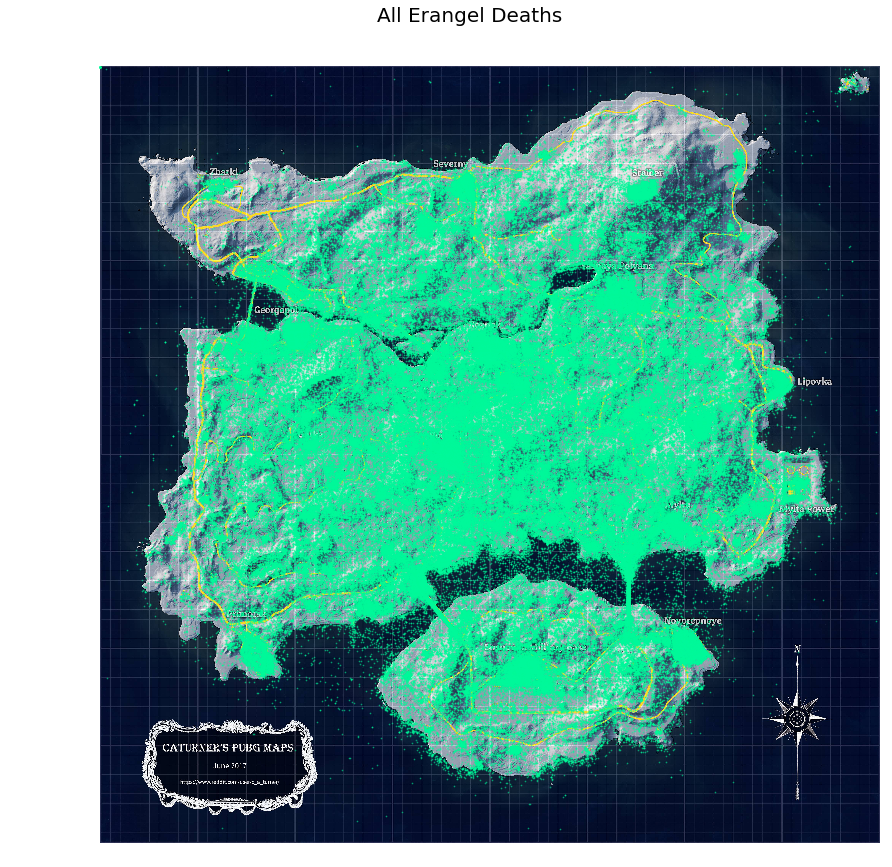

In [4]:
fig, ax = plt.subplots(figsize = (15,15))
im = plt.imread('img/erangelMap.jpg')
ax.imshow(im, extent=[0, 813000, -810000, 0], zorder=1)
ax.set_title("All Erangel Deaths", fontsize=20)
ax.set_axis_off()

ax.scatter(x=list(erangel_Map['victim_position_x']), y=list(-1*erangel_Map['victim_position_y']), s=0.5, color="mediumspringgreen", alpha=0.5, zorder=2)

plt.show()

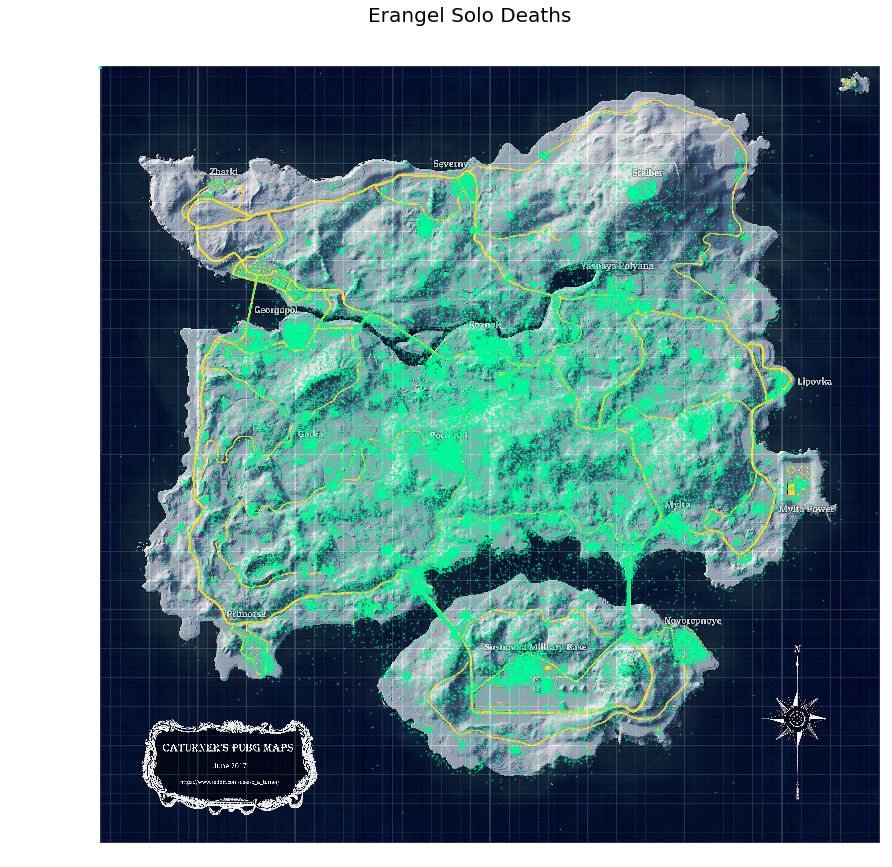

In [5]:
fig, ax = plt.subplots(figsize = (15,15))
im = plt.imread('img/erangelMap.jpg')
ax.imshow(im, extent=[0, 813000, -810000, 0], zorder=1)
ax.set_title("Erangel Solo Deaths", fontsize=20)
ax.set_axis_off()

ax.scatter(x=list(solo_erangel['victim_position_x']), y=list(-1*solo_erangel['victim_position_y']), s=0.5, color="mediumspringgreen", alpha=0.5, zorder=2)

plt.show()

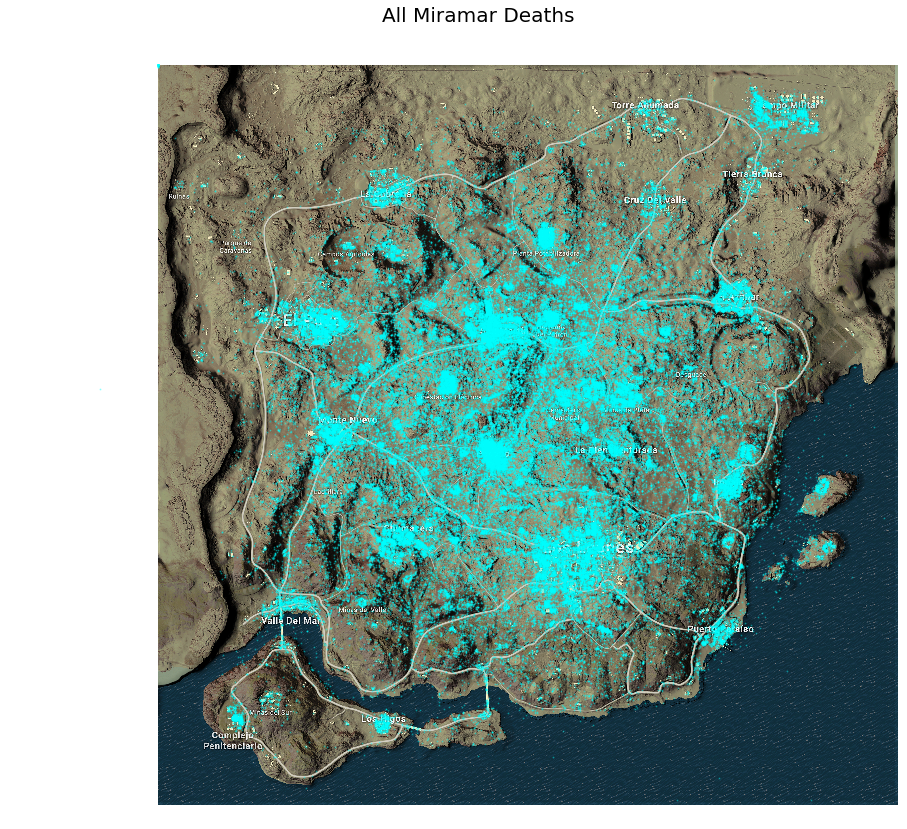

In [6]:
fig, ax = plt.subplots(figsize = (15,15))

im = plt.imread('img/miramarMap.png')
ax.imshow(im, extent=[0, 820000, -820000, 0], zorder=1)
ax.scatter(x=list(miramar_Map['victim_position_x']), y=list(-1*miramar_Map['victim_position_y']), s=1, color="cyan", alpha=0.3, zorder=2)
ax.set_title("All Miramar Deaths", fontsize=20)
# ax.set_xlabel("x coordinate", fontsize=15)
# ax.set_ylabel("y coordinate", fontsize=15)
ax.set_axis_off()

plt.show()

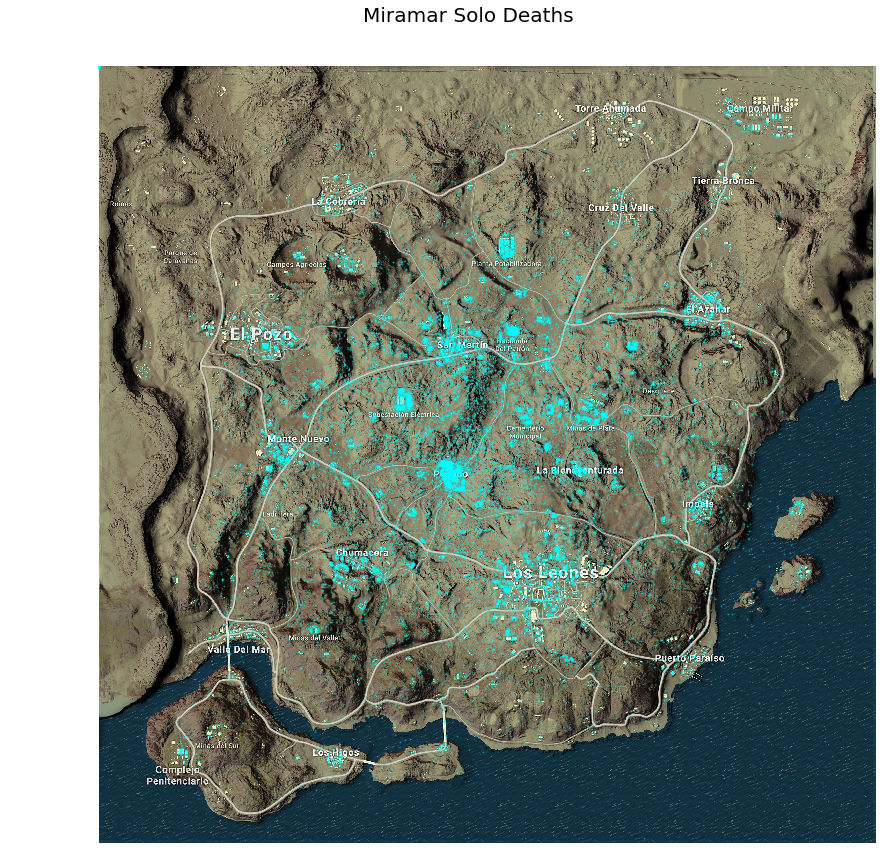

In [7]:
fig, ax = plt.subplots(figsize = (15,15))

im = plt.imread('img/miramarMap.png')
ax.imshow(im, extent=[0, 820000, -820000, 0], zorder=1)
ax.scatter(x=list(solo_miramar['victim_position_x']), y=list(-1*solo_miramar['victim_position_y']), s=1, color="cyan", alpha=0.3, zorder=2)
ax.set_title("Miramar Solo Deaths", fontsize=20)
# ax.set_xlabel("x coordinate", fontsize=15)
# ax.set_ylabel("y coordinate", fontsize=15)
ax.set_axis_off()

plt.show()

[Back to Top](#top)

<a/ id='weapons'></a>
### Analysis of Weapons
***

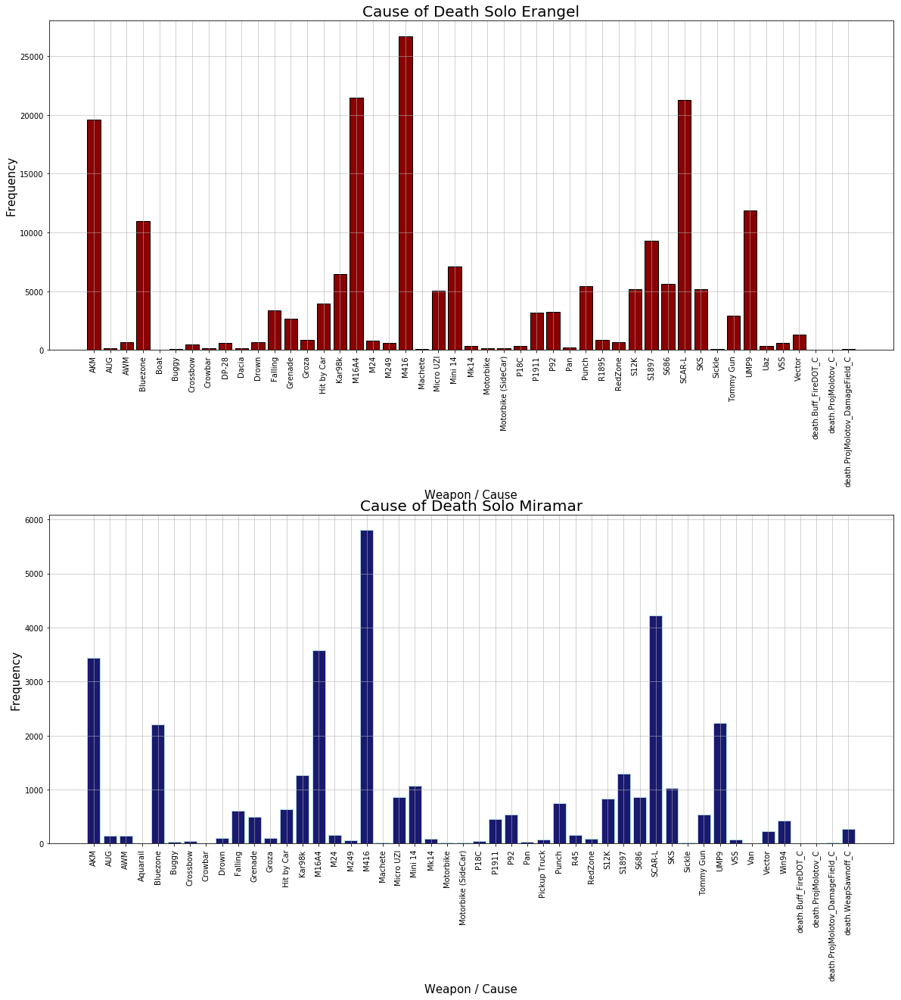

In [8]:
erangelWeapon = list(solo_erangel['killed_by'])
erangelUniqueWeapon = list(set(erangelWeapon))
erangelWeaponCount = []
for i in erangelUniqueWeapon:
    erangelWeaponCount.append(erangelWeapon.count(i))
    
miramarWeapon = list(solo_miramar['killed_by'])
miramarUniqueWeapon = list(set(miramarWeapon))
miramarWeaponCount = []
for i in miramarUniqueWeapon:
    miramarWeaponCount.append(miramarWeapon.count(i))    
    
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(20,20))
fig.subplots_adjust(hspace=0.5)

ax[0].set_title("Cause of Death Solo Erangel", fontsize=20)
ax[0].set_xlabel("Weapon / Cause", fontsize=15)
ax[0].set_ylabel("Frequency", fontsize=15)
ax[0].grid(True, alpha=0.69)
ax[0].bar(erangelUniqueWeapon, erangelWeaponCount, facecolor="darkred", edgecolor="black")
for tick in ax[0].get_xticklabels():
    tick.set_rotation(90)
    
ax[1].set_title("Cause of Death Solo Miramar", fontsize=20)
ax[1].set_xlabel("Weapon / Cause", fontsize=15)
ax[1].set_ylabel("Frequency", fontsize=15)
ax[1].grid(True, alpha=0.69)
ax[1].bar(miramarUniqueWeapon, miramarWeaponCount, facecolor="midnightblue", edgecolor="lightblue")
for tick in ax[1].get_xticklabels():
    tick.set_rotation(90)
    
plt.show()

### Mean Distance Between Killer and Victim
***

In [9]:
# https://stackoverflow.com/questions/5407969/distance-formula-between-two-points-in-a-list?utm_medium=organic&utm_source=google_rich_qa&utm_campaign=google_rich_qa
def distance(p0, p1):
    return math.sqrt((p0[0] - p1[0])**2 + (p0[1] - p1[1])**2)

killer_x = solo_erangel['killer_position_x'].tolist()
killer_y = solo_erangel['killer_position_y'].tolist()
victim_x = solo_erangel['victim_position_x'].tolist()
victim_y = solo_erangel['victim_position_y'].tolist()

distances_erengel = []
for i in range(len(killer_x)):
    if math.isnan(killer_x[i]) or math.isnan(killer_y[i]):
        pass
    else:
        killer_xy = (killer_x[i], killer_y[i])
        victim_xy = (victim_x[i], victim_y[i])
        distances_erengel.append(distance(victim_xy, killer_xy))
print("Mean distance between killer and victim for Erangel", np.mean(distances_erengel))

killer_x = solo_miramar['killer_position_x'].tolist()
killer_y = solo_miramar['killer_position_y'].tolist()
victim_x = solo_miramar['victim_position_x'].tolist()
victim_y = solo_miramar['victim_position_y'].tolist()

distances_miramar = []
for i in range(len(killer_x)):
    if math.isnan(killer_x[i]) or math.isnan(killer_y[i]):
        pass
    else:
        killer_xy = (killer_x[i], killer_y[i])
        victim_xy = (victim_x[i], victim_y[i])
        distances_miramar.append(distance(victim_xy, killer_xy))
print("Mean distance between killer and victim for Miramar", np.mean(distances_miramar))

Mean distance between killer and victim for Erangel 19199.91473566369
Mean distance between killer and victim for Miramar 17628.468785757374


### Mean Distance Between Killer and Victim Based on Weapon
***

In [10]:
weapon_erangel = solo_erangel[['killed_by', 'killer_position_x', 'killer_position_y', 'victim_position_x', 'victim_position_y']]
weapon_erangel = weapon_erangel.dropna()
weapon_erangel = weapon_erangel[~weapon_erangel['victim_position_x'].isin([0.0]) & ~weapon_erangel['killer_position_x'].isin([0.0])]

weapon_miramar = solo_miramar[['killed_by', 'killer_position_x', 'killer_position_y', 'victim_position_x', 'victim_position_y']]
weapon_miramar = weapon_miramar.dropna()
weapon_miramar = weapon_miramar[~weapon_miramar['victim_position_x'].isin([0.0]) & ~weapon_miramar['killer_position_x'].isin([0.0])]

In [11]:
# ERANGEL
erangel_weapons_dict = {}
for index, row in weapon_erangel.iterrows():
    killer_xy = (row[1], row[2])
    victim_xy = (row[3], row[4])
    dist = distance(killer_xy, victim_xy)
    key = str(row[0])
    if key not in erangel_weapons_dict:
        erangel_weapons_dict[key] = [dist]
    else:
        erangel_weapons_dict[key].append(dist)
        
erangel_weapons = []
erangel_weapons_distance = []
for key, value in erangel_weapons_dict.items():
    erangel_weapons.append(key)
    erangel_weapons_distance.append(value)
    
mean_erangel_weapons_dist = []
for i in erangel_weapons:
    mean_erangel_weapons_dist.append(np.mean(erangel_weapons_dict[i]))

# MIRAMAR
miramar_weapons_dict = {}
for index, row in weapon_miramar.iterrows():
    killer_xy = (row[1], row[2])
    victim_xy = (row[3], row[4])
    dist = distance(killer_xy, victim_xy)
    key = str(row[0])
    if key not in miramar_weapons_dict:
        miramar_weapons_dict[key] = [dist]
    else:
        miramar_weapons_dict[key].append(dist)
        
miramar_weapons = []
miramar_weapons_distance = []
for key, value in miramar_weapons_dict.items():
    miramar_weapons.append(key)
    miramar_weapons_distance.append(value)
    
mean_miramar_weapons_dist = []
for i in miramar_weapons:
    mean_miramar_weapons_dist.append(np.mean(miramar_weapons_dict[i]))

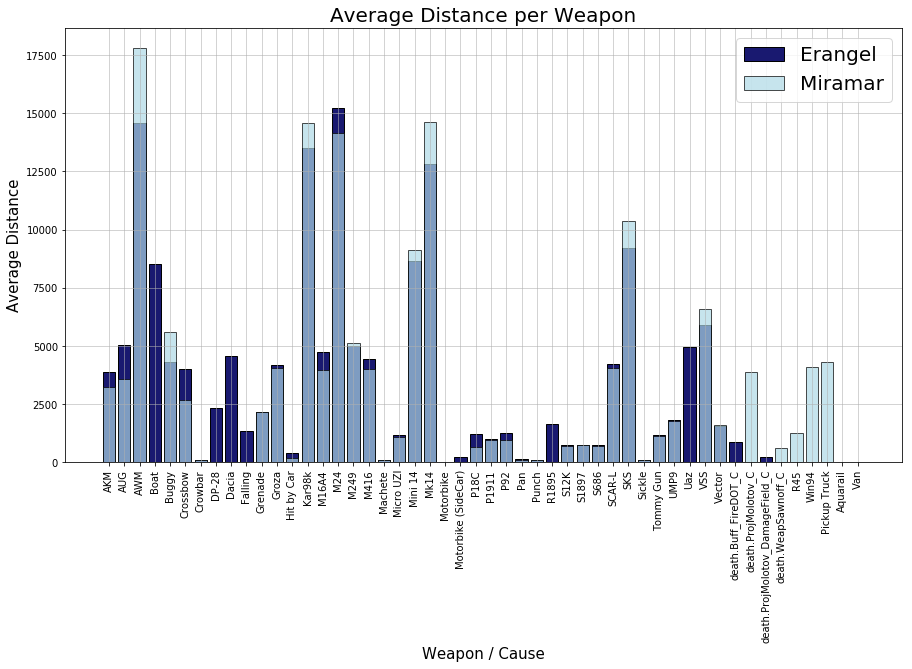

In [12]:
# PLOT
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,8))
fig.subplots_adjust(hspace=0.5)

ax.set_title("Average Distance per Weapon", fontsize=20)
ax.set_xlabel("Weapon / Cause", fontsize=15)
ax.set_ylabel("Average Distance", fontsize=15)
ax.grid(True, alpha=0.69)
ax.bar(erangel_weapons, mean_erangel_weapons_dist, facecolor="midnightblue", edgecolor="black", label="Erangel")
ax.bar(miramar_weapons, mean_miramar_weapons_dist, facecolor="lightblue", edgecolor="black", label="Miramar", alpha=0.69)
plt.legend(loc=1, prop={'size': 20})
for tick in ax.get_xticklabels():
    tick.set_rotation(90)

erangel_weapons_distance = [item for sublist in erangel_weapons_distance for item in sublist]
miramar_weapons_distance = [item for sublist in miramar_weapons_distance for item in sublist]

plt.show()

[min, q1, median, q3, max]
Erangel 5 number summary: [0.0, 508.78881171576705, 1401.9012019397032, 4495.034968592026, 132563.08618967046]
Miramar 5 number summary: [0.0, 576.9417994910646, 1533.6323418603122, 4229.306800174253, 99427.32471448682]


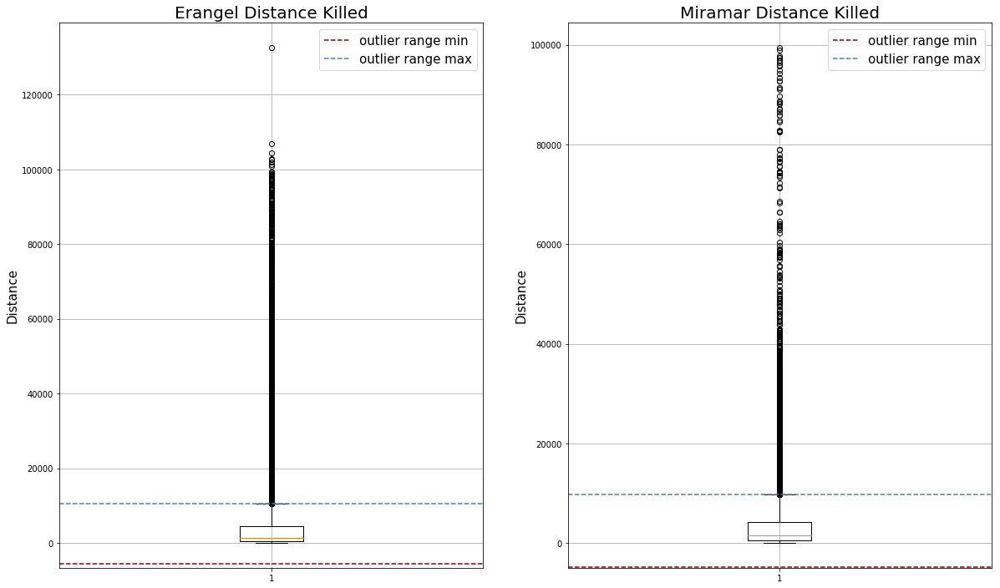

In [13]:
minValue = min(erangel_weapons_distance)
maxValue = max(erangel_weapons_distance)
q1 = np.percentile(erangel_weapons_distance , 25)
median = np.percentile(erangel_weapons_distance, 50) # q2
q3 = np.percentile(erangel_weapons_distance, 75)
iqr = q3 - q1
box_min_line_erangel = q1 - 1.5 * iqr
box_max_line_erangel = q3 + 1.5 * iqr
five_num_summary_erangel = [minValue, q1, median, q3, maxValue]

minValue = min(miramar_weapons_distance)
maxValue = max(miramar_weapons_distance)
q1 = np.percentile(miramar_weapons_distance, 25)
median = np.percentile(miramar_weapons_distance, 50) # q2
q3 = np.percentile(miramar_weapons_distance, 75)
iqr = q3 - q1
box_min_line_miramar = q1 - 1.5 * iqr
box_max_line_miramar = q3 + 1.5 * iqr
five_num_summary_miramar = [minValue, q1, median, q3, maxValue]

print("[min, q1, median, q3, max]")
print("Erangel 5 number summary: {}".format(five_num_summary_erangel))
print("Miramar 5 number summary: {}".format(five_num_summary_miramar))

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,12))
fig.subplots_adjust(hspace=0.5)

ax[0].set_title("Erangel Distance Killed", fontsize=20)
ax[0].set_ylabel("Distance", fontsize=15)
ax[0].grid()

ax[1].set_title("Miramar Distance Killed", fontsize=20)
ax[1].set_ylabel("Distance", fontsize=15)
ax[1].grid()

ax[0].boxplot(erangel_weapons_distance)
ax[0].axhline(y=box_min_line_erangel, color='darkred', linestyle='--', label='outlier range min')
ax[0].axhline(y=box_max_line_erangel, color='steelblue', linestyle='--', label='outlier range max')

ax[1].boxplot(miramar_weapons_distance)
ax[1].axhline(y=box_min_line_miramar, color='darkred', linestyle='--', label='outlier range min')
ax[1].axhline(y=box_max_line_miramar, color='steelblue', linestyle='--', label='outlier range max')

ax[0].legend(loc=1, prop={'size': 15})
ax[1].legend(loc=1, prop={'size': 15})
plt.show()

[Back to Top](#top)


<a/ id='k-means'></a>
### K-Means Clustering
***

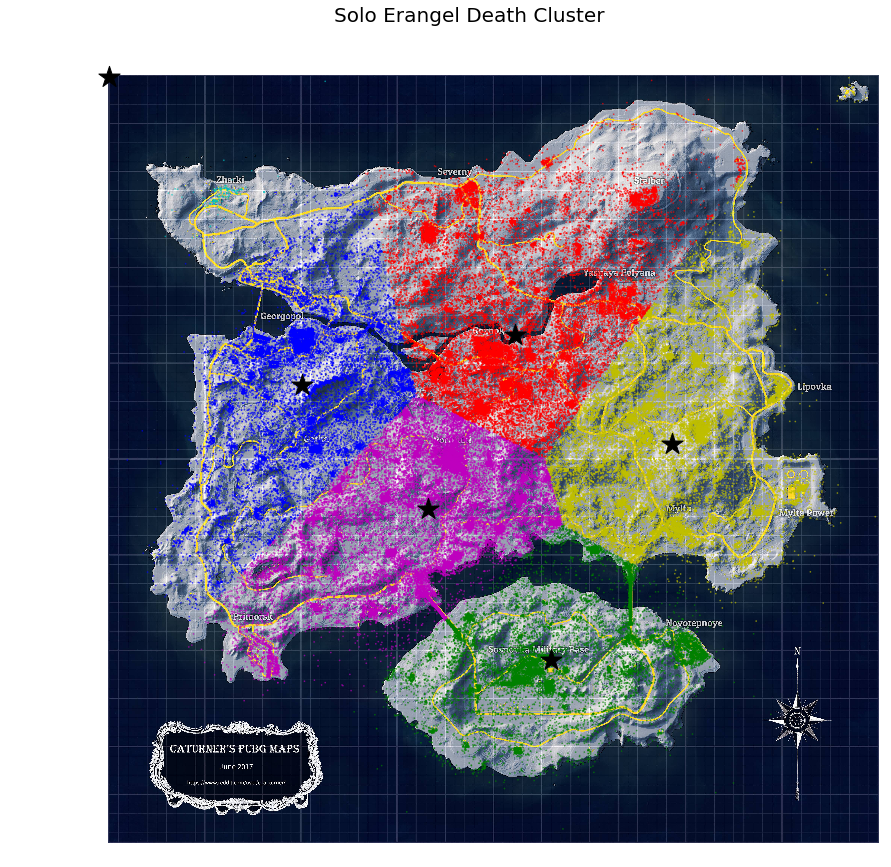

In [14]:
erangel_x = list(solo_erangel['victim_position_x'])
erangel_y = list(-1*solo_erangel['victim_position_y'])
X = np.array(list(zip(erangel_x, erangel_y)))

kmeans = KMeans(n_clusters=6)
kmeans = kmeans.fit(X)
labels = kmeans.predict(X)
# Getting the cluster centers
C = kmeans.cluster_centers_

fig, ax = plt.subplots(figsize = (15,15))

im = plt.imread('img/erangelMap.jpg')
ax.set_title("Solo Erangel Death Cluster", fontsize=20)
ax.set_axis_off()

ax.imshow(im, extent=[0, 813000, -810000, 0], zorder=1)
colors = ['r','b','y','g','c','m']
ax.scatter(X[:, 0], X[:, 1], color=[colors[l_] for l_ in labels], s=0.5, alpha=0.6, label=labels, zorder=2)
ax.scatter(C[:, 0], C[:, 1], marker='*', c='black', s=500, zorder=3)

plt.show()

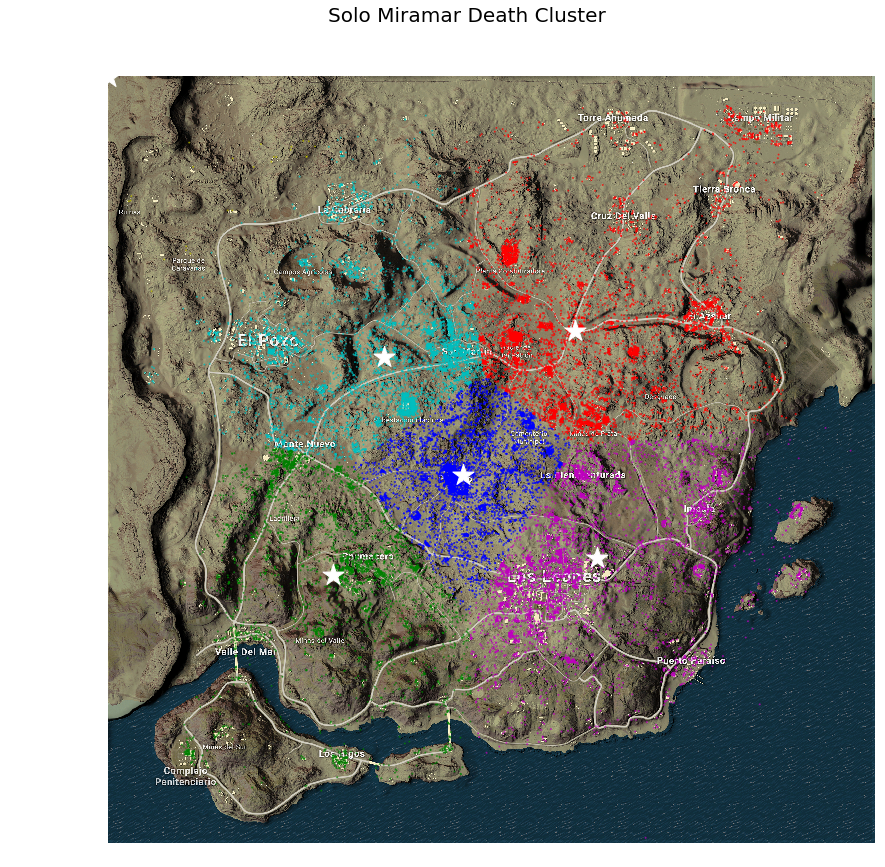

In [15]:
miramar_x = list(solo_miramar['victim_position_x'])
miramar_y = list(-1*solo_miramar['victim_position_y'])
X = np.array(list(zip(miramar_x, miramar_y)))

kmeans = KMeans(n_clusters=6)
kmeans = kmeans.fit(X)
labels = kmeans.predict(X)
# Getting the cluster centers
C = kmeans.cluster_centers_
        
fig, ax = plt.subplots(figsize = (15,15))

im = plt.imread('img/miramarMap.png')
ax.set_title("Solo Miramar Death Cluster", fontsize=20)
ax.set_axis_off()

ax.imshow(im, extent=[0, 820000, -820000, 0], zorder=1)
colors = ['r','b','y','g','c','m']
ax.scatter(X[:, 0], X[:, 1], color=[colors[l_] for l_ in labels], s=1, alpha=0.6, label=labels, zorder=2)
ax.scatter(C[:, 0], C[:, 1], marker='*', c='white', s=500, zorder=3)

plt.show()

[Back to Top](#top)

<a/ id='final_kill'></a>
### Final Kill Clustering
***

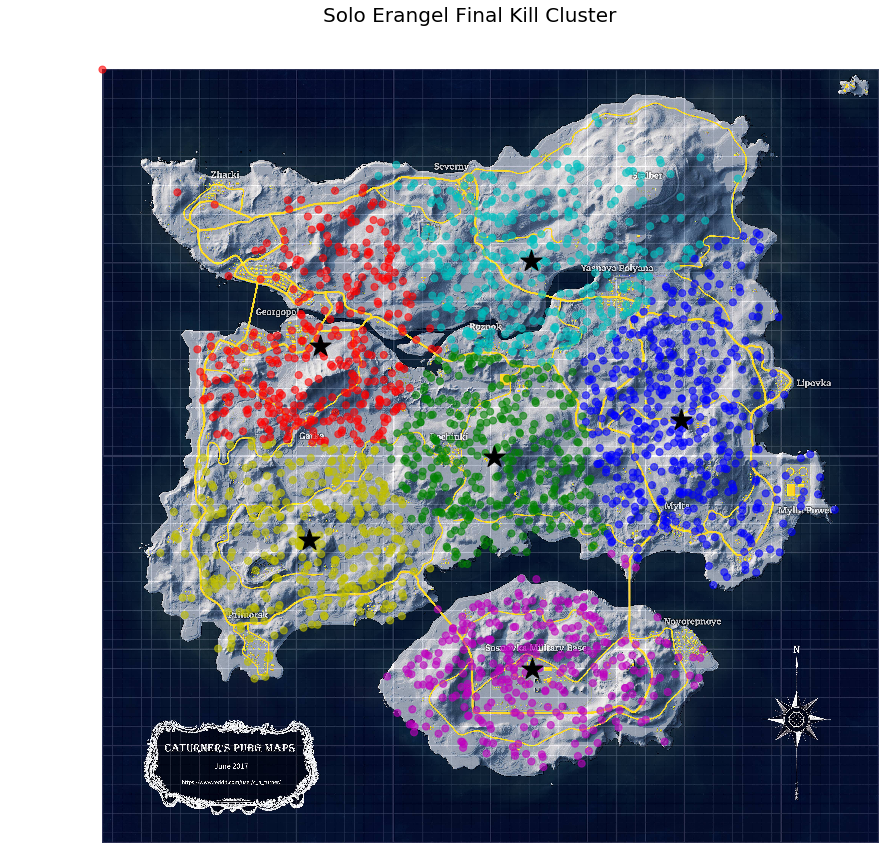

In [28]:
# final circle
final_circle_erang_solo_x = list(solo_erangel.loc[solo_erangel['victim_placement'] == 2, 'victim_position_x'])
final_circle_erang_solo_y = list(-1*solo_erangel.loc[solo_erangel['victim_placement'] == 2, 'victim_position_y'])
X = np.array(list(zip(final_circle_erang_solo_x, final_circle_erang_solo_y)))

kmeans = KMeans(n_clusters=6)
kmeans = kmeans.fit(X)
labels = kmeans.predict(X)
# Getting the cluster centers
C = kmeans.cluster_centers_

fig, ax = plt.subplots(figsize = (15,15))

im = plt.imread('img/erangelMap.jpg')
ax.set_title("Solo Erangel Final Kill Cluster", fontsize=20)
ax.set_axis_off()
ax.imshow(im, extent=[0, 813000, -810000, 0], zorder=1)
colors = ['r','b','y','g','c','m']
ax.scatter(X[:, 0], X[:, 1], color=[colors[l_] for l_ in labels], s=50, alpha=0.6, label=labels, zorder=2)
ax.scatter(C[:, 0], C[:, 1], marker='*', c='black', s=500, zorder=3)

plt.show()

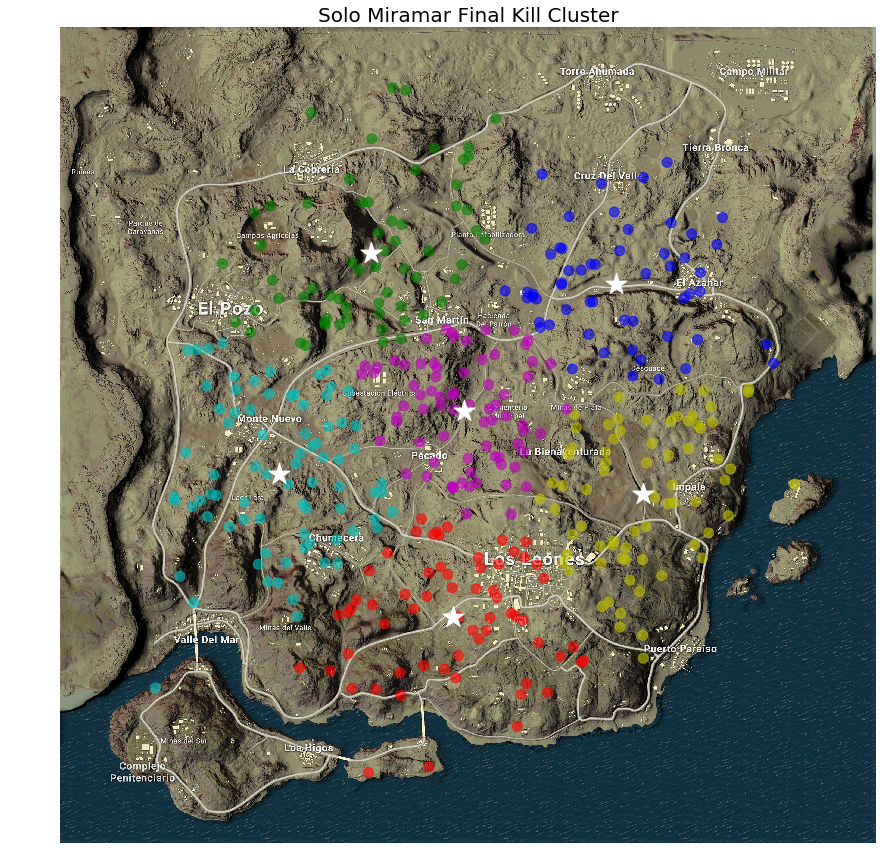

In [29]:
final_circle_mira_solo_x = list(solo_miramar.loc[solo_miramar['victim_placement'] == 2, 'victim_position_x'])
final_circle_mira_solo_y = list(-1*solo_miramar.loc[solo_miramar['victim_placement'] == 2, 'victim_position_y'])
X = np.array(list(zip(final_circle_mira_solo_x, final_circle_mira_solo_y)))

kmeans = KMeans(n_clusters=6)
kmeans = kmeans.fit(X)
labels = kmeans.predict(X)
# Getting the cluster centers
C = kmeans.cluster_centers_
        
fig, ax = plt.subplots(figsize = (15,15))

im = plt.imread('img/miramarMap.png')
ax.set_title("Solo Miramar Final Kill Cluster", fontsize=20)
ax.set_axis_off()

ax.imshow(im, extent=[0, 820000, -820000, 0], zorder=1)
colors = ['r','b','y','g','c','m']
ax.scatter(X[:, 0], X[:, 1], color=[colors[l_] for l_ in labels], s=100, alpha=0.6, label=labels, zorder=2)
ax.scatter(C[:, 0], C[:, 1], marker='*', c='white', s=500, zorder=3)

plt.show()

[Back to Top](#top)

<a/ id='tips'></a>
## Tips and Tricks

### Maps:
The heatmaps showing the locations of deaths on both maps show us where players are likely to engage their competitors. The heatmaps show where the map is the hottest, so players looking to find some quick action should look to land or go to areas with opaque marks on the heatmaps. Players looking to play the long-con should avoid those hot spots and land in the small towns and villages that are less "hot". By zooming in on the maps, we can see where in the cities a player is more likely to die, such as the shipment yard in South Georopol. A player looking to increase his chances of survival should avoid such an area, and a player looking to score some kills should investigate those areas for players. A clever player should have the heatmaps memorized or readily available so as to increase their chances scoring kills, and decrease their chances of running into enemies.

### Weapons: 
There is a lot of information to be obtained from the weapons data. We can see that on both maps, the M416 is king. However, when the M416 is not an option, it seems as the M16A4 is just as effective as the SCAR-L on Erangel, while the SCAR-L is a stronger killer on Miramar. 

Another interesting find is that, in the shotguns category, the S1897 is more effective than the S686, and both of which are more effective than the S12K. This is despite the S12K being an automatic shotgun. This may be because the S12K is less common in the early-game, which is when shotguns are the most effective as players are still scrambling to find their weapons. However, a player with the choice of the double barrel shotgun and the pump-action shotgun should always choose the pump-action. 

In terms of the long-range sniper rifles, we see that the Mini-14 scores kills more frequently than the Kar98K on Erangel, but not on Miramar. So on Erangel, it may be the wiser choice to use the Mini-14 than the Kar98K, while the opposite being true on Miramar.

This also coincides with the rarity/commonality of the weapons. We see that weapons only obtainable via air-dropped crates have very few kills.

#### Weapons Distance:
Looking at the average killing distance of the weapons, we can see the effective range of each of the guns and the most likely engagement distance.

For the longer-range weapons, such as the AWM, Kar98K and the like, Miramar typically has a longer engagement distance. Therefore, we know that if a player is on the Miramar map, they are more likely to be engaging at a slightly longer distance than when playing on Erangel.  A player with this knowledge should choose weapons that are more effective at further ranges on Miramar. This also makes long-range sights and scopes more valuable on Miramar than on Erangel.

An interesting fact to note from this comparison is the effective range of each of the guns. We see that the AWM is the best for engaging enemies at extreme distances, followed by the M24. One thing to note is that the Kar98K is has a similar average kill distance as the MK14. However, the Kar98K is a bolt-action rifle, and therefore has a firing rate much slower than the MK14. If a player is given a choice between the Kar98K and the MK14, it is perhaps a wise choice to choose the MK14 because it can push more bullets out faster while still being effective at the same range.

For the common assault rifles, we see that the M16A4 is the most effective at longer ranges, followed by the M416, and then the SCAR-L, and lastly the AKM. Therefore, the AKM is most effective battle-rifle for closer ranges and urban combat, while the M16A4 is well equipped to handle engagements at longer ranges. The AUG, though extremely rare, is even stronger at longer ranges than the M16A4, so a player with this rifle can typically trust it to be effective at longer distances than the other assault rifles.

Knowledge of the weapons' average distance for kills gives players a competitive edge. When the playing area is small, a player should probably switch to a closer range weapon that has a shorter average kill distance.

### Death Clustering:
By using k-means to cluster the deaths on each map, we can see where the "regions" of each map is, as well as the average death location on each "region". We see that on Erangel, we have a a Georgopol region, a Rozhok Northern region, an Eastern region, a Pochinki region, and a Military Island region. It is common for players to stay in their respective regions for the first half of the match as they are typically visiting nearby towns and villages to look for loot. The smaller a K-means clusterign region is, the more data points are in that region. Therefore, the regions with a smaller area are hot regions and therefore you are more likely to find other players in such regions. The Military Island and the Pochinki regions fo the map on Erangel are the smallest in area and therefore they are they are the areas players are dying in the most.

On Miramar, we see a Pecado region, and four other regions corresponding to NorthWest, NorthEast, SouthWest, and SouthEast. This is because Pecado is a very popular area for players as it is central in the map and therefore a lot of players are dying in that area. In the rest of the regions, players are less likely to find enemy players than in the Pecado region. So a player trying to traverse the map should probably avoid the pecado region as a whole unless they are looking to find other players on the way.

The final kill clusters show us where the final playzone should more or less be. We see that the regions are comparable to the death clusters because the final circle is always in a random area and the final kill may be anywhere. However, we see that he final kill is likely to be on land, so the final circle has a tendency to land further in land than bordering a body of water. A clever player could use this information to guess where their next playzone may be and therefore be able to be a couple steps ahead of their opponents.

[Back to Top](#top)

<a/ id='conclusion'></a>
### Conclusion
***

[Back to Top](#top)